# [Strange attractors](https://examples.pyviz.org/attractors/attractors.html)

## Visualizing attractors

An attractor is a set of values to which a numerical system tends to evolve. An attractor is called a strange attractor if the resulting pattern has a fractal structure. This notebook shows how to calculate and plot two dimensional attractors of various types using the code and parameters. For this We will use some special python libraries like `Dashader` and `Numba`.

Datashader is a python library that allows to create beautiful images from large amount of apatial data.

Numba is an open source numpy aware optimizing compiler for python used here qhickly compute the trajectories

## Practice

$$ x_{n+1} = sin(a*y_{n}) + c*cos(a*x_{n}) $$
$$ y_{n+1} = sin(b*x_{n}) + d*cos(b*y_{n}) $$

#### import libraries

In [170]:
import numpy as np
import pandas as pd
from numba import jit
from math import sin,cos, sqrt, fabs

#### define ODE

In [171]:
@jit(nopython=True)
def Clifford(x,y,a,b,c,d,*o):
    
    return sin(a*y) + c*cos(a*x),\
           sin(b*x) + d*cos(b*y)

we will then evaluate this equation 10 million times, creating a set of x,y coordinates visited. The `@jit` here and above is optional but it makes code **50x** faster

#### function to get trajectory

In [172]:
n = 10000000

@jit(nopython=True)
def trajectory_coords(fn, x0,y0,a,b=0,c=0,d=0,e=0,f=0,n=n):
    
    # cretae empty arrays
    x,y = np.zeros(n), np.zeros(n) 
    # initial conditions
    x[0],y[0] = x0,y0
    # get the trajectory
    for i in np.arange(n-1):
        x[i+1], y[i+1] = fn(x[i], y[i], a,b,c,d,e,f)
    return x,y    

In [173]:
def trajectory(fn, x0,y0,a,b=0,c=0,d=0,e=0,f=0,n=n):
    
    x,y = trajectory_coords(fn,x0,y0,a,b,c,d,e,f,n)
    return pd.DataFrame(dict(x=x,y=y))

#### run simulation

In [174]:
 df = trajectory(Clifford, 0, 0, -1.3, -1.3, -1.8, -1.9)

In [ ]:
df.tail()

We can now aggregate these 10million continuous coordinates into a discrete rectangular grid with `Datashader`, counting each time a point fell into that grid cell:

In [ ]:
import datashader as ds

In [175]:
cvs = ds.Canvas(plot_width=500, plot_height=500)
agg = cvs.points(df, "x","y")
print(agg.values[190:195,190:195],"\n")

[[23 27 25 15 22]
 [25 15 21 15 25]
 [23 19 22 39 18]
 [22 20 32 30 35]
 [12 23 15 19 16]] 



A small portion of grid is shown above but it is difficult to see the grids structure fro the numerical values. To see the entire array at once, we can turn each grid cell into a pixel, using a grayscale value from white to black:

In [176]:
from datashader import transfer_functions as tf

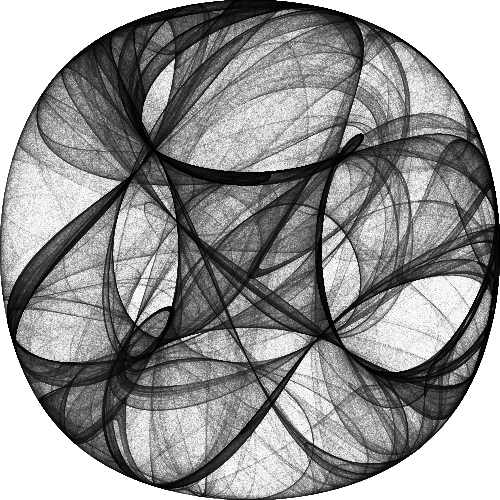

In [177]:
ds.transfer_functions.Image.border=0

tf.shade(agg, cmap=["white","black"])

To explore further let us wrap up the above aggregation and shading commands into a single function so we can apply them mor easily:

#### All plot in one function

In [178]:
def dsplot(fn, vals, n=n, cmap=viridis, label=True):
    """
    Return a Datashader image by collecting 'n' trajectory points
    for the given attractor function
    """
    # labels
    lab = ("{}, "*(len(vals)-1)+" {}").format(*vals) if label else None
    # get trajectory data
    df = trajectory(fn, *vals, n=n)
    # make canvas object
    cvs = ds.Canvas(plot_width=300,plot_height=300)
    agg = cvs.points(df, "x","y")
    img = tf.shade(agg, cmap=cmap, name=lab)
    return img

And let us load some colormaps that we can use for the subsequent plots:

In [179]:
from datashader.colors import inferno, viridis

In [180]:
from colorcet import palette
palette["viridis"] = viridis
palette["inferno"] = inferno

we can now use colormaps with a pre-selected set of Clifford attractor parameter values(stored in seperate YAML-format text file) to show a wide variety of trajectories that these equations can form:

#### Read the parameter values from file in YAML format

In [181]:
import yaml

In [182]:
vals = yaml.load(open("strange_attractors.yml","r"))

In [183]:
vals[0:3]

[['Clifford', 'bgy', 0, 0, -1.3, -1.3, -1.8, -1.9],
 ['Clifford', 'bmw', 0, 0, -1.4, 1.6, 1.0, 0.7],
 ['Clifford', 'bgyw', 0, 0, 1.7, 1.7, 0.6, 1.2]]

In [184]:
def args(name):
    """
    Return a list of available argument lists for the given type of attractor
    """
    return [v[1:] for v in vals if v[0]==name]

In [185]:
# test to get the parameters for all Cliffold plots we want to plot
args("Clifford")

[['bgy', 0, 0, -1.3, -1.3, -1.8, -1.9],
 ['bmw', 0, 0, -1.4, 1.6, 1.0, 0.7],
 ['bgyw', 0, 0, 1.7, 1.7, 0.6, 1.2],
 ['bmy', 0, 0, 1.7, 0.7, 1.4, 2.0],
 ['fire', 0, 0, -1.7, 1.8, -1.9, -0.4],
 ['gray', 0, 0, 1.1, -1.32, -1.03, 1.54],
 ['kgy', 0, 0, 0.77, 1.99, -1.31, -1.45],
 ['kbc', 0, 0, -1.9, -1.9, -1.9, -1.0],
 ['viridis', 0, 0, 0.75, 1.34, -1.93, 1.0],
 ['inferno', 0, 0, -1.32, -1.65, 0.74, 1.81],
 ['bgy', 0, 0, -1.6, 1.6, 0.7, -1.0],
 ['bmw', 0, 0, -1.7, 1.5, -0.5, 0.7]]

#### plot the attractors for different parameters

In [186]:
def plot_attractors(fn, vals=None, **kw):
    """
    Plot the given attractor "fn" once per provided set of arguments
    """
    vargs = args(fn.__name__) if vals is None else vals
    
    return tf.Images(*[dsplot(fn, v[1:],cmap=palette[v[0]][::-1],**kw) for v in vargs]).cols(4)

## 1. Clifford attractors 

$$ x_{n+1} = sin(a*y_{n}) + c*cos(a*x_{n}) $$
$$ y_{n+1} = sin(b*x_{n}) + d*cos(b*y_{n}) $$

In [187]:
@jit(nopython=True)
def Clifford(x,y,a,b,c,d,*o):
    
    return sin(a*y) + c*cos(a*x),\
           sin(b*x) + d*cos(b*y)

"0, 0, -1.3, -1.3, -1.8, -1.9","0, 0, -1.4, 1.6, 1.0, 0.7","0, 0, 1.7, 1.7, 0.6, 1.2","0, 0, 1.7, 0.7, 1.4, 2.0"
"0, 0, -1.7, 1.8, -1.9, -0.4","0, 0, 1.1, -1.32, -1.03, 1.54","0, 0, 0.77, 1.99, -1.31, -1.45","0, 0, -1.9, -1.9, -1.9, -1.0"
"0, 0, 0.75, 1.34, -1.93, 1.0","0, 0, -1.32, -1.65, 0.74, 1.81","0, 0, -1.6, 1.6, 0.7, -1.0","0, 0, -1.7, 1.5, -0.5, 0.7"

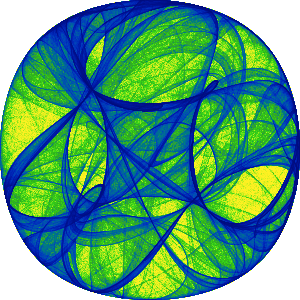
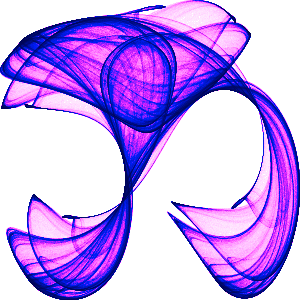
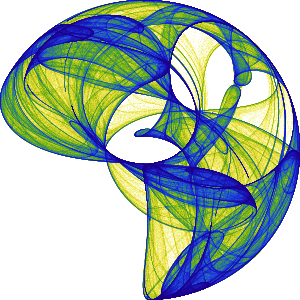
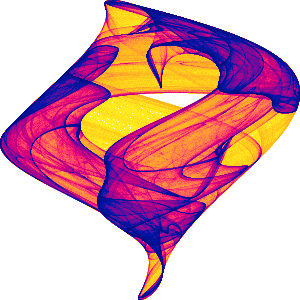
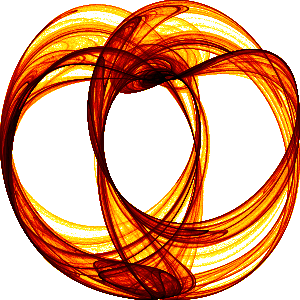
...
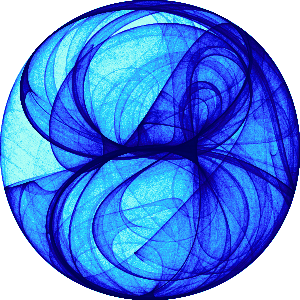
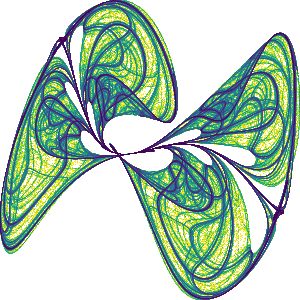
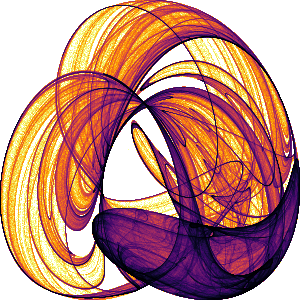
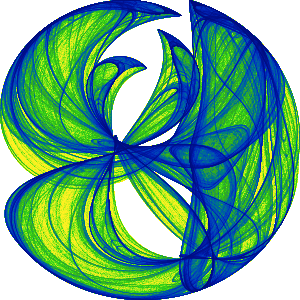
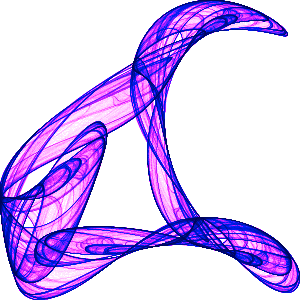

In [188]:
plot_attractors(Clifford)

## 2. De Jong attractors

$$ x_{n+1} = sin(a*y_{n}) - cos(b*x_{n}) $$
$$ y_{n+1} = sin(c*x_{n}) - cos(d*y_{n}) $$

In [189]:
@jit
def De_Jong(x,y,a,b,c,d,*o):
    
    return sin(a*y) - cos(b*x), \
           sin(c*x) - cos(d*y)

"0, 0, -1.244, -1.251, -1.815, -1.908","0, 0, 1.7, 1.7, 0.6, 1.2","0, 0, 1.4, -2.3, 2.4, -2.1","0, 0, -2.7, -0.09, -0.86, -2.2"
"0, 0, -0.827, -1.637, 1.659, -0.943","0, 0, -2.24, 0.43, -0.65, -2.43","0, 0, 2.01, -2.53, 1.61, -0.33","0, 0, 1.4, 1.56, 1.4, -6.56"

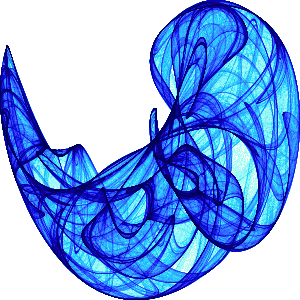
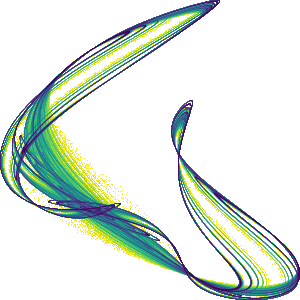
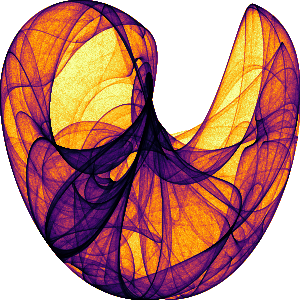
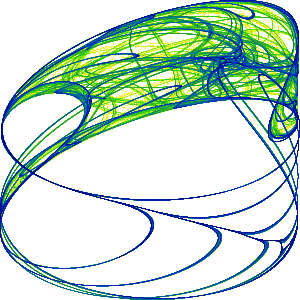
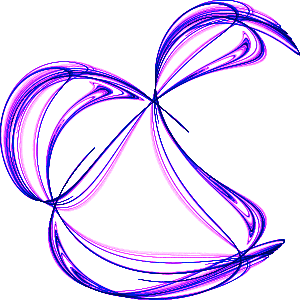
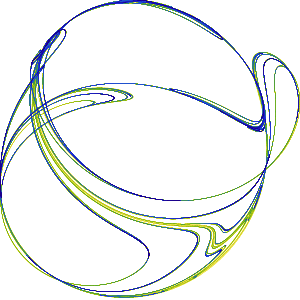
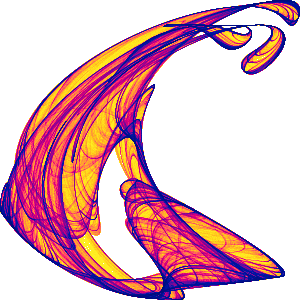
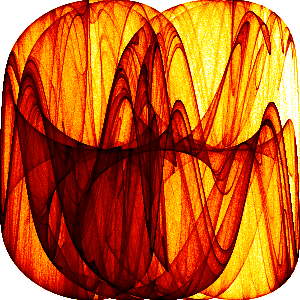

In [190]:
plot_attractors(De_Jong)

## 3. Svensson attractors

$$ x_{n+1} = d*sin(a*x_{n}) - sin(b*y_{n}) $$
$$ y_{n+1} = c*cos(a*x_{n}) + cos(b*y_{n}) $$

In [192]:
@jit
def Svensson(x,y,a,b,c,d,*o):
    
    return d * sin(a*x) - sin(b*y),\
           c * cos(a*x) + cos(b*y)

"0, 0, 1.5, -1.8, 1.6, 0.9","0, 0, -1.78, 1.29, -0.09, -1.18","0, 0, -0.91, -1.29, -1.97, -1.56","0, 0, 1.4, 1.56, 1.4, -6.56"

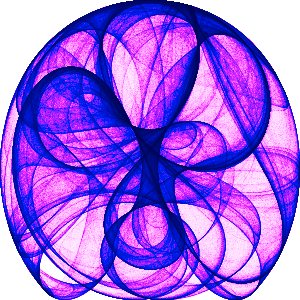
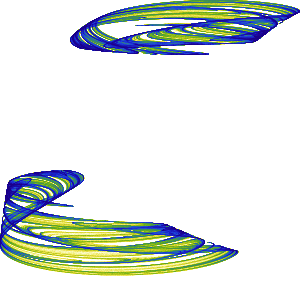
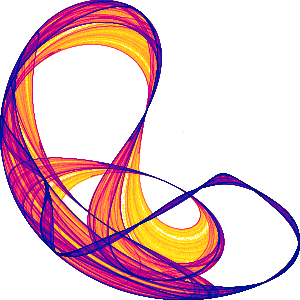
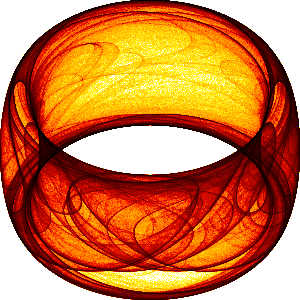

In [193]:
plot_attractors(Svensson)

## 4. Fractal Dream Attractor

In [ ]:
@jit(nopython=True)
def Fractal_Dream(x,y,a,b,c,d,*o):
    
    return sin(y*b) + c*sin(x*b),\
           sin(x*a) + d*sin(y*a)

In [ ]:
plot(Fractal_Dream)

## 5. [Hopalong Attractor](https://www.maplesoft.com/support/help/maple/view.aspx?path=MathApps/HopalongAttractor)

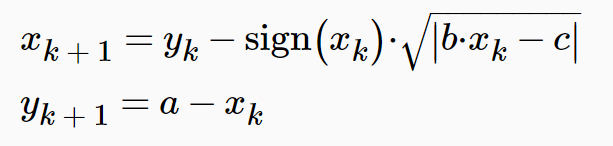

In [ ]:
@jit(nopython=True)
def Hopalong1(x,y,a,b,c,*o):
    
    return y-np.sign(x)*sqrt(fabs(b*x-c)),\
           a-x

In [ ]:
@jit(nopython=True)
def Hopalong2(x,y,a,b,c,*o):
    
    return y-1.0-np.sign(x)*sqrt(fabs(b*x-c)),\
           a-x

In [ ]:
plot_attractors(Hopalong1)

In [ ]:
plot_attractors(Hopalong2)

## 6. [Gumowski-Mira Attractor](http://kgdawiec.bplaced.net/badania/pdf/cacs_2010.pdf)

http://paulbourke.net/fractals/GumowskiMira/index.html

Gumowski-Mira transform, in short GM, produces nice looking fractal forms that can be used tomodle marine living creatures. 

Combination of GM with superfractals lead to enlarging a variety of fractal forms possible to create. 

Super fractals introduced by Barnsley can be used to create fractal forms that inherit shape features from Fractal parents. 

![image.png](http://paulbourke.net/fractals/GumowskiMira/eq1.jpg)

![image.png](http://paulbourke.net/fractals/GumowskiMira/eq2.jpg)

This model has been introduced for modeling and study accelerated particled trajectories at CERN

#### super fractals vs Fractals

Fractals are fully described by Iterated Function System and generated by deterministic or stochastic algorithem.

The main drawback of fractals is that it its ideal self-similarity that is rather rarely observed in Nature. So modeling natural objects with the help of classic fractals leads to non-realistic results. Take for example Barnsley's fern that can be obtained as a sum of many scaled, translated, rotated and sheared copies of itself. This leades to the situation in which all Barnley's ferns are similar to each other in opposite to ferns in reality where the litter ferns are littel different from each other. That result can be obtained by the usage of some probabilistic mechanism which is implemented in Superfractals 

#### plotting

In [194]:
@jit(nopython=True)
def G(x,mu):
    """
    transfermation function
    """
    return mu*x + 2*(1-mu)*x**2/(1.0+ x**2)

In [195]:
@jit(nopython=True)
def Gumowski_Mira(x,y,a,b,mu,*o):
    
    xnext = y + a*(1-b*y**2)*y + G(x,mu)
    ynext = G(xnext,mu) - x
    return xnext,ynext

"0.1, 0.1, 0.0, 0.5, -0.75","0, 1, 0.008, 0.05, -0.496","0.1, 0.1, 0.0, 0.5, -0.7509","0, 1, 0.0, 0.5, -0.22"
"0, 1, 0.008, 0.05, -0.9","0, 1, 0.008, 0.05, -0.45","0.1, 0.1, 0.008, 0.05, 0.16","0, 0.5, 0.008, 0.05, -0.7"
"0.5, 0, 0.0, 0.05, -0.2","0.5, 0.5, 0.0, 0.05, -0.22","0, 0.5, 0.0, 0.05, -0.31","0, 0.5, 0.0, 0.05, -0.55"
"0.5, 0.5, 0.0, 0.05, -0.23","0.5, 0.5, 0.009, 0.05, 0.32","0.1, 0.1, 0.0, 0.5, -0.65","0.0, 0.5, 0.0, 0, -0.578"
"0.0, 0.5, 0.0, 0, -0.604","0.0, 0.5, 0.0, 0, 0.228","0.0, 0.5, 0.0, 0, -0.002","0.0, 0.5, 0.0, 0, -0.623"

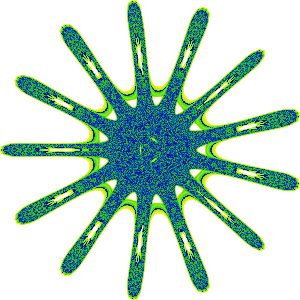
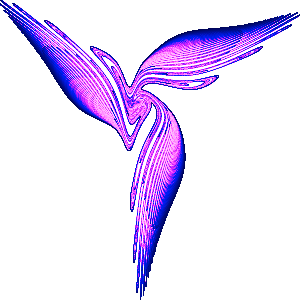
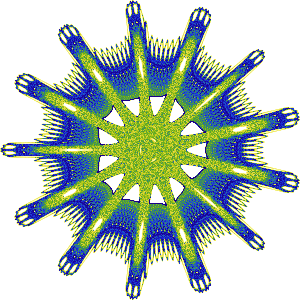
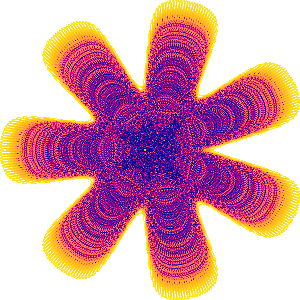
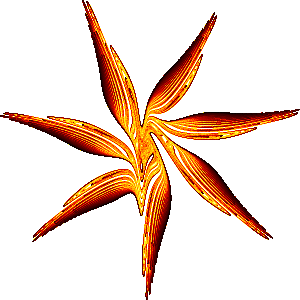
...
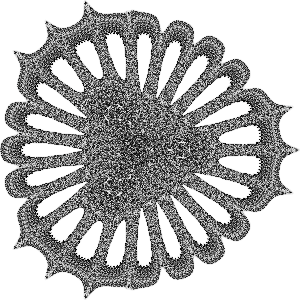
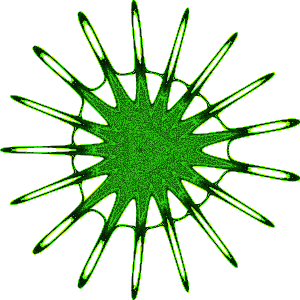
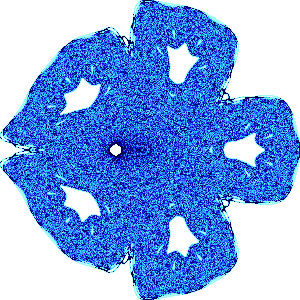
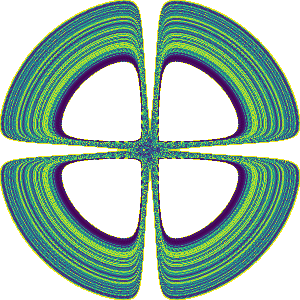
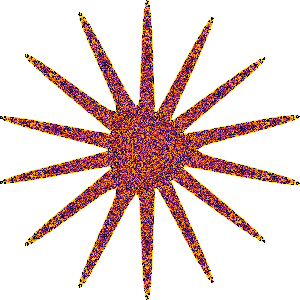

In [196]:
plot_attractors(Gumowski_Mira)

## 7. Symmetric Icon Attractor

The Hopalong and Gumowski-Mira equations often result in symmetric patterns, but a different appraoch is to force he patterns to be symmetric. Such examples can be found from the book "[Symmetry in Chaos](https://www.researchgate.net/profile/Martin_Golubitsky/publication/250564304_Symmetric_Chaos_How_and_Why/links/53db85590cf2a76fb6679ff7/Symmetric-Chaos-How-and-Why.pdf?_sg%5B0%5D=Hd2l8KD-jbZHIbJDwb-HpbYVzL6Oh9DddMskzapDnsGWtCQic7nORr8KzMLIL8L7Pp5StN_9HFRK7izsEaBoLQ.I-qtrnIM9ehehvU43NzXHT0NfcZJgEa1GFfk9DDIuqggwDwTk_agBCbETL8zDSYEe3ynLghco9cvZbM9DFOXqg&_sg%5B1%5D=L8MYGvymcxYWvLkoZJ6ZG3TITE7AQ2of3k-Hgqsw-wBkzq4nVPFfONb4cepUM6stxKxoK-S-IkOF519GNjUNrfuZflOB0nqne8Zzku1CWDyU.I-qtrnIM9ehehvU43NzXHT0NfcZJgEa1GFfk9DDIuqggwDwTk_agBCbETL8zDSYEe3ynLghco9cvZbM9DFOXqg&_sg%5B2%5D=oL2kWblKtj8rYjCgoAqdMp4-ImratfZ_8DSMtHUwTTeBKnugQU_s5C-9vIWGzI_0byxrPIvAJ3aRd3g8jolRx0bwvfon.I-qtrnIM9ehehvU43NzXHT0NfcZJgEa1GFfk9DDIuqggwDwTk_agBCbETL8zDSYEe3ynLghco9cvZbM9DFOXqg&_iepl=)" by Micahals andMartin 

In [197]:
@jit(nopython=True)
def Symmetric_Icon(x,y,a,b,g,om,l,d,*o):
    
    zzbar = x*x + y*y
    p = a*zzbar + l
    zreal, zimag = x,y
    
    for i in range(1,d-1):
        za = zreal*x - zimag*y
        zb = zimag*x + zreal*y
        zreal ,zimag = za,zb
        
    zn = x*zreal - y*zimag
    p += b*zn
    
    return p*x + g*zreal - om*y,\
           p*y - g*zimag + om*x

"0.01, 0.01, 1.8, 0.0, 1.0, 0.1, -1.93, 5","0.01, 0.01, 5.0, -1.0, 1.0, 0.188, -2.5, 5","0.01, 0.01, -1.0, 0.1, -0.82, 0.12, 1.56, 3","0.01, 0.01, 1.806, 0.0, 1.0, 0.0, -1.806, 5"
"0.01, 0.01, 10.0, -12.0, 1.0, 0.0, -2.195, 3","0.01, 0.01, -2.5, 0.0, 0.9, 0.0, 2.5, 3","0.01, 0.01, 3.0, -16.79, 1.0, 0.0, -2.05, 9","0.01, 0.01, 5.0, 1.5, 1.0, 0.0, -2.7, 6"
"0.01, 0.01, 1.0, -0.1, 0.167, 0.0, -2.08, 7","0.01, 0.01, 2.32, 0.0, 0.75, 0.0, -2.32, 5","0.01, 0.01, -2.0, 0.0, -0.5, 0.0, 2.6, 5","0.01, 0.01, 2.0, 0.2, 0.1, 0.0, -2.34, 5"
"0.01, 0.01, 2.0, 0.0, 1.0, 0.1, -1.86, 4","0.01, 0.01, -1.0, 0.1, -0.82, 0.0, 1.56, 3","0.01, 0.01, -1.0, 0.03, -0.8, 0.0, 1.455, 3","0.01, 0.01, -2.5, -0.1, 0.9, -0.15, 2.39, 16"

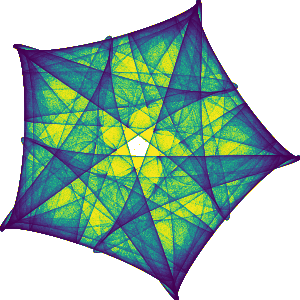
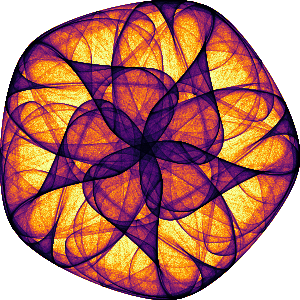
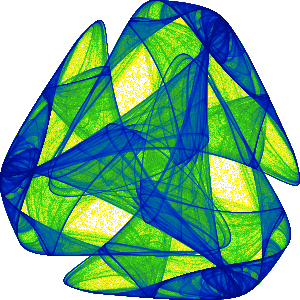
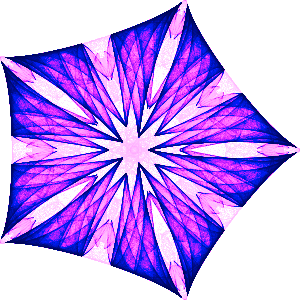
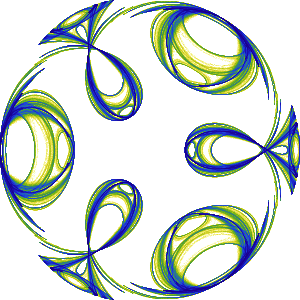
...
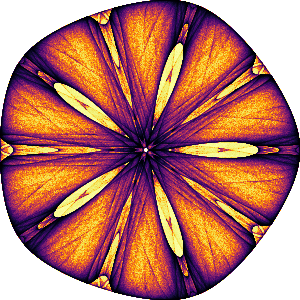
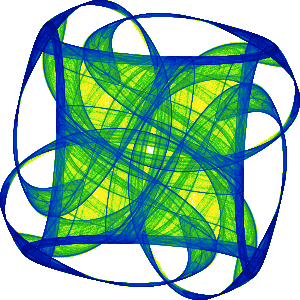
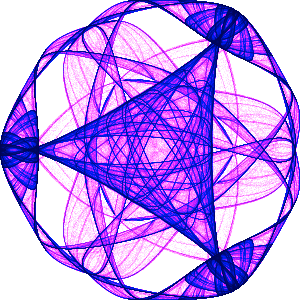
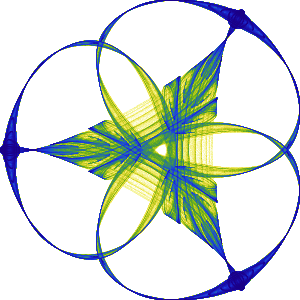
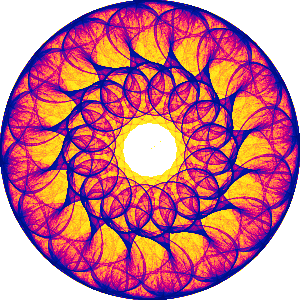

In [198]:
plot(Symmetric_Icon)

## Interactive Plotting

We can use Datashader with `HoloViews` and `Bokeh` to zoom in and see the individual steps in any of these calculations

In [199]:
import holoviews as hv
from holoviews.operation.datashader import datashade, dynspread

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
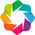

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

In [200]:
hv.extension("bokeh")
dynspread(datashade(hv.Points(trajectory(Clifford, *(args("Clifford")[5][1:]))),
                   cmap= viridis[::-1]).opts(width=500,height=400))

Each time you zoom in in a live process, the data will be aggregated, which should take a small fraction of a second for 10 million points. Eventually once you zoom in enough you shouold see individual data points, as we are not connecting the points into a trajectory tree.

You can also try to connect the dots which will reveal how the particle jumps discretely from one region of space to the another

Again if you zoom in on a live server, teh plot will update so that you can see the individual tracs involvd.

Once the live server, you can also explore to find you own parameter values that generate interesting patters:

In [201]:
def hv_clif(a,b,c,d,x0=0,y0=0,n=10000):
    
    """
    function that plots trajectory
    """
    return datashade(hv.Points(trajectory(Clifford, x0,y0,a,b,c,d,n)),
                    cmap=inferno[::-1],dynamic=False)

In [202]:
x0,y0,a,b,c,d = args("Clifford")[6][1:]
x0

0

In [204]:
dm = hv.DynamicMap(hv_clif, kdims=["a","b","c","d"])
dm = dm.redim.range(a=(-2.0,2.0),b=(-2.0,2.0),c=(-2.0,2.0),d=(-2.0,2.0))
dm = dm.redim.default(a=a,b=b,c=c,d=d).opts(width=400,height=400)
dm

:DynamicMap   [a,b,c,d]
   :RGB   [x,y]   (R,G,B,A)